# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [308]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Polygon

%matplotlib inline

In [309]:
# constants used for testing purpose only
CALIBRATION_IMAGES = 'camera_cal/calibration*.jpg'
ORIGINAL_IMAGES = 'test_images/*.jpg'

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# number of chessboard corners
nx = 9
ny = 6

# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

## Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

In [310]:
def camera_calibration(images, nx, ny, show=False):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,4,0),(6,5,0),...
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

    # Make a list of calibration images
    images = glob.glob(images)

    # Step through the list and search for chessboard corners
    for fname in images:
        
        img = cv2.imread(fname)
        corner_img = np.copy(img)
    
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)
    
        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            if show:
                # Draw and display the corners
                cv2.drawChessboardCorners(corner_img, (nx,ny), corners, ret)
                f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
                ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
                ax1.set_title('Original Image', fontsize=18)
                ax2.imshow(cv2.cvtColor(corner_img, cv2.COLOR_BGR2RGB))
                ax2.set_title('With Corners', fontsize=18)

    # Camera calibration, given object points, image points, and the shape of the grayscale image
    if (len(objpoints) > 0):
        # Camera successfully calibrated.
        print("Camera successfully calibrated.")
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    else:
        # Unable to calibrate the camera.
        print("Unable to calibrate the camera.")
        ret, mtx, dist, rvecs, tvecs = (None, None, None, None, None)
    return mtx, dist

Camera successfully calibrated.


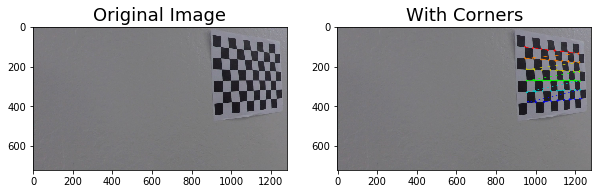

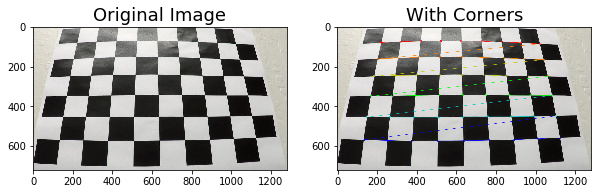

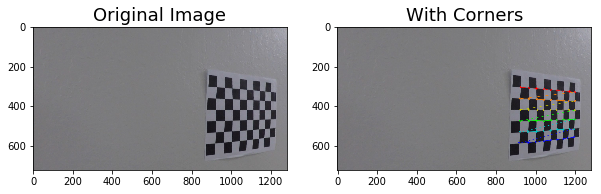

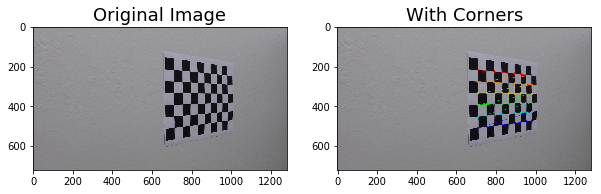

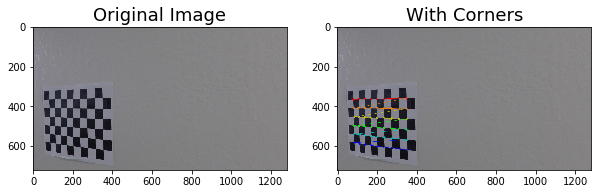

...

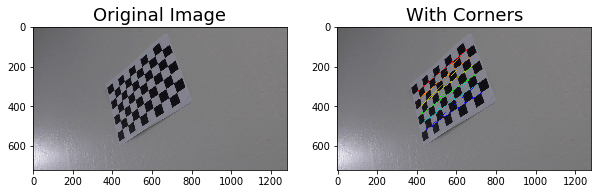

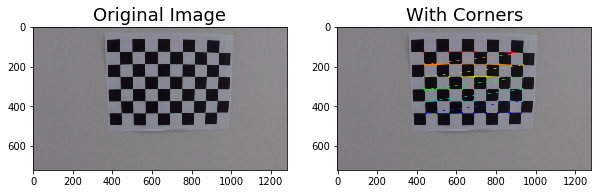

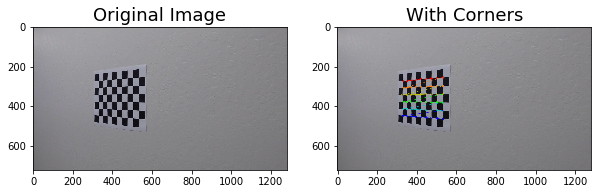

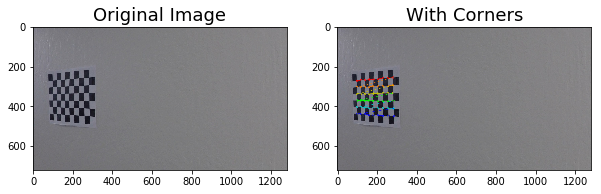

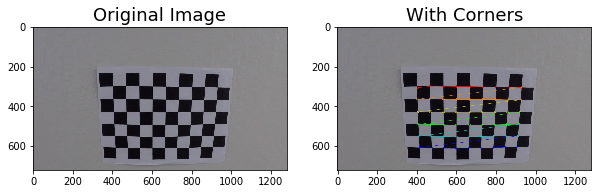

In [311]:
#test camera calibration
mtx, dist = camera_calibration(CALIBRATION_IMAGES, nx, ny, show=True)

## Apply a distortion correction to raw images.

In [312]:
def undistort(img, mtx, dist, undist_image='', show=False):
    # Test undistortion on an image
    img_size = (img.shape[1], img.shape[0])
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    if undist_image != '':
        mpimg.imsave(undist_image,undist)

    # Visualize undistortion
    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(undist)
        ax2.set_title('Undistorted Image', fontsize=30)

    return undist

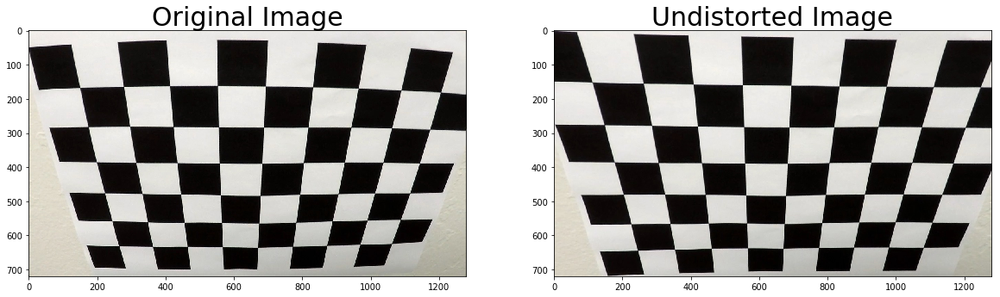

In [313]:
#test undistort on calibration image
cal_img = cv2.imread('camera_cal/calibration2.jpg')
cal_img = cv2.cvtColor(cal_img, cv2.COLOR_BGR2RGB)
_ = undistort(cal_img, mtx, dist,'output_images/calibration2_undistortion.jpg', show=True)

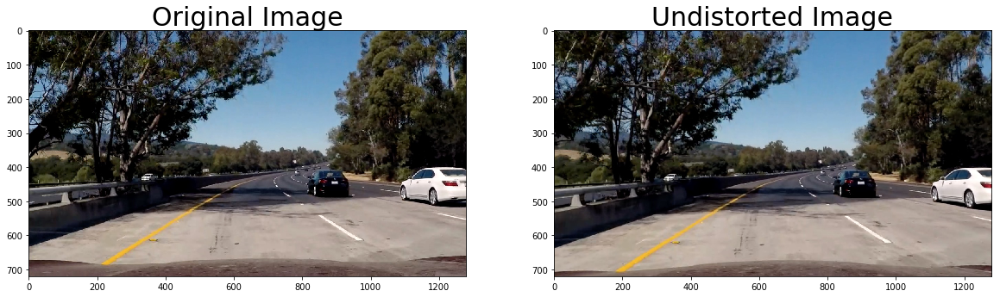

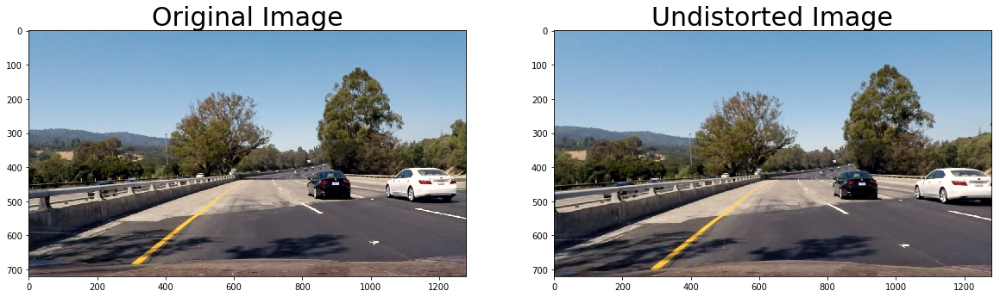

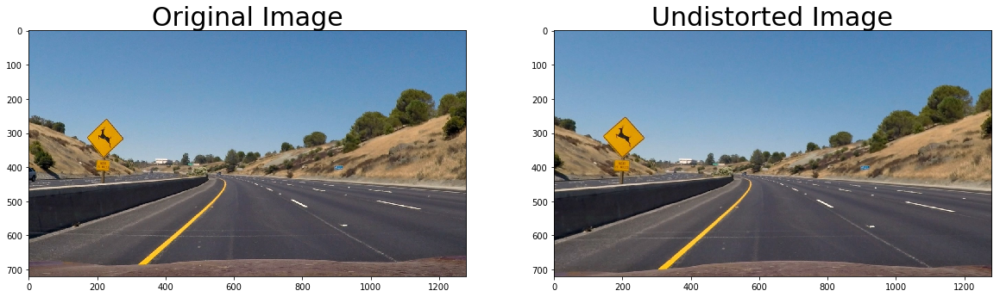

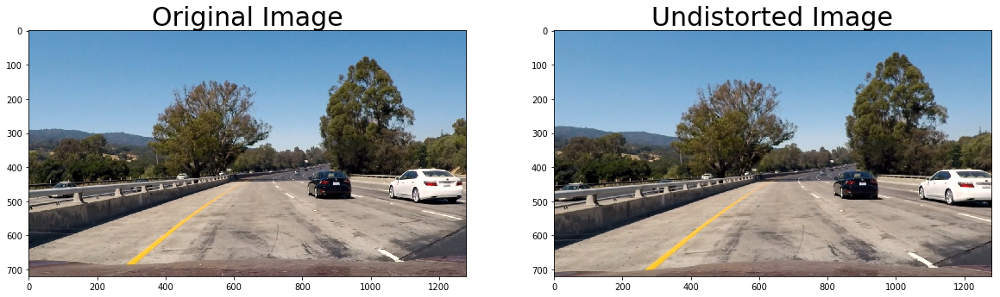

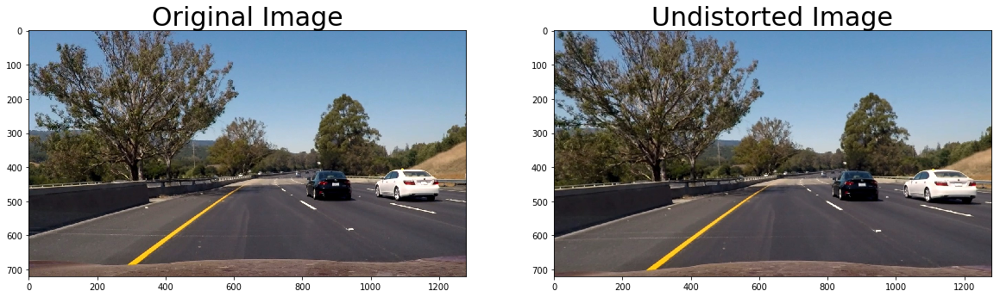

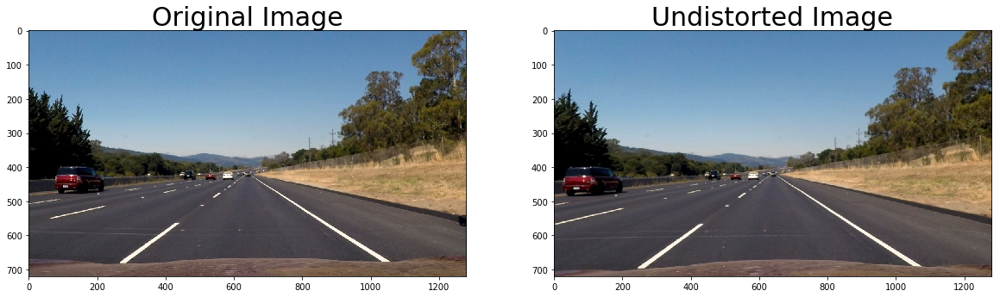

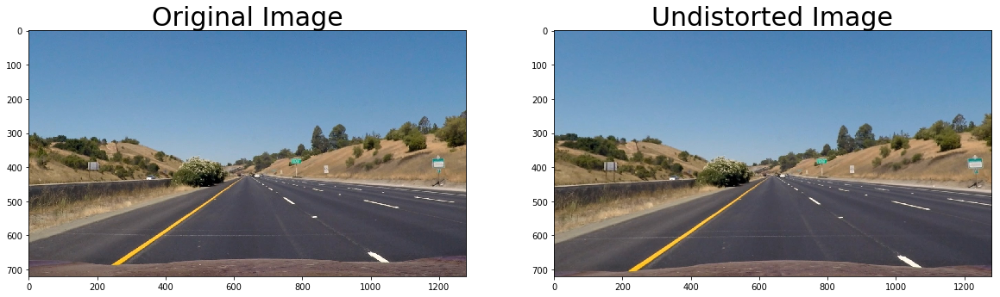

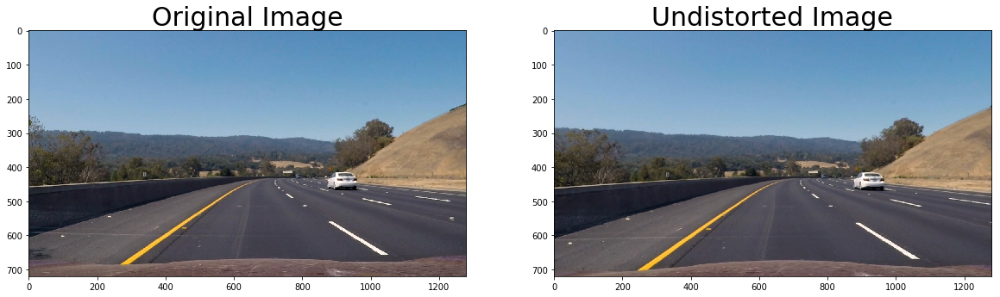

In [314]:
#Apply undistort on test images
images = glob.glob(ORIGINAL_IMAGES)
for fname in images:
    imgs = cv2.imread(fname)
    imgs = cv2.cvtColor(imgs, cv2.COLOR_BGR2RGB)
    _ = undistort(imgs, mtx, dist, fname.replace('test_images','output_images').replace('.jpg', '_undist.jpg'), show=True)

## Use color transforms, gradients, etc., to create a thresholded binary image.

In [315]:
def threshold(img, b_thresh=(145, 200), l_thresh=(215, 255),out_image='', show = False):
    img = np.copy(img)

    # Generate binary thresholded images
    b_channel = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)[:,:,2]
    l_channel = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)[:,:,0]  
    
    # Set the upper and lower thresholds for the b channel
    b_thresh_min = b_thresh[0]
    b_thresh_max = b_thresh[1]
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
    
    # Set the upper and lower thresholds for the l channel
    l_thresh_min = l_thresh[0]
    l_thresh_max = l_thresh[1]
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1

    combined_binary = np.zeros_like(b_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1
    
    if out_image != '':
        plt.imsave(out_image.replace('.jpg', '_b_ch.jpg'), b_binary, cmap='gray')
        plt.imsave(out_image.replace('.jpg', '_l_ch.jpg'), l_binary, cmap='gray')
        plt.imsave(out_image.replace('.jpg', '_thresh.jpg'), combined_binary, cmap='gray')
        
    if show:
        f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))
        ax1.set_title('Undistorted image', fontsize=16)
        ax1.imshow(img)
        ax2.set_title('b_binary', fontsize=16)
        ax2.imshow(b_binary,cmap='gray')
        ax3.set_title('l_binary', fontsize=16)
        ax3.imshow(l_binary,cmap='gray')
        ax4.set_title('Thresholded', fontsize=16)
        ax4.imshow(combined_binary,cmap='gray')
        
    return combined_binary

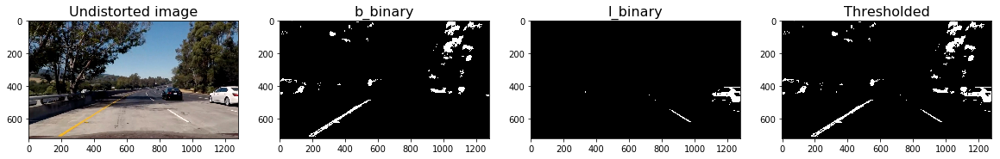

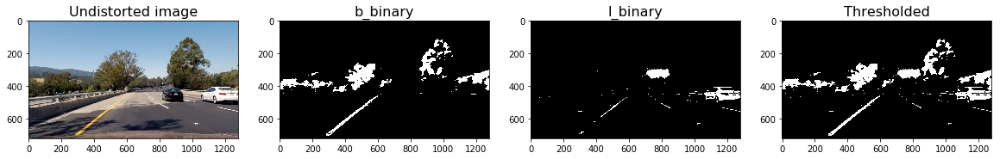

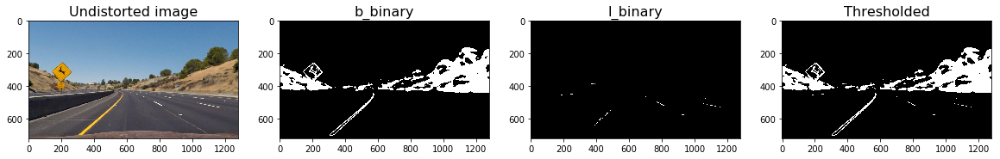

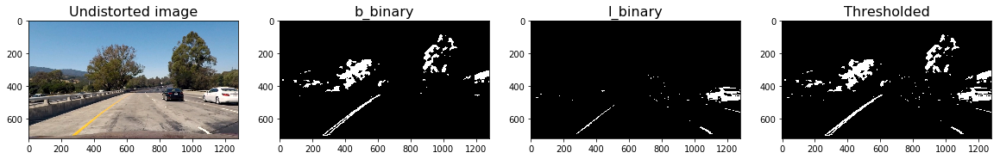

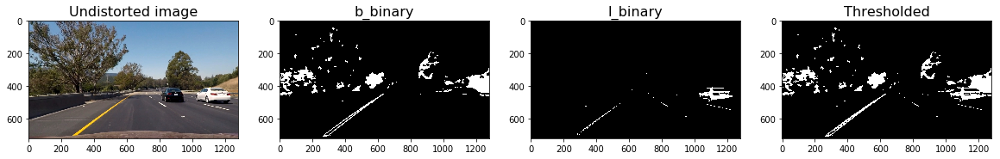

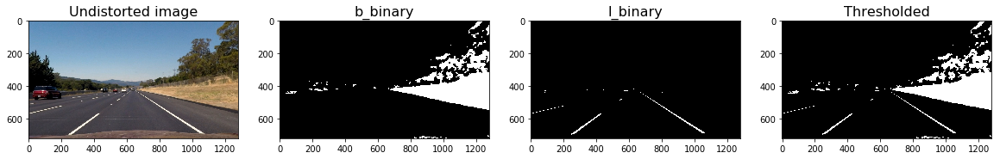

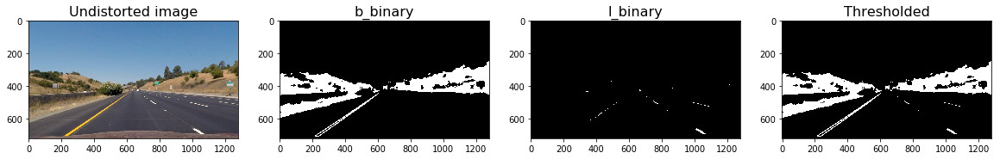

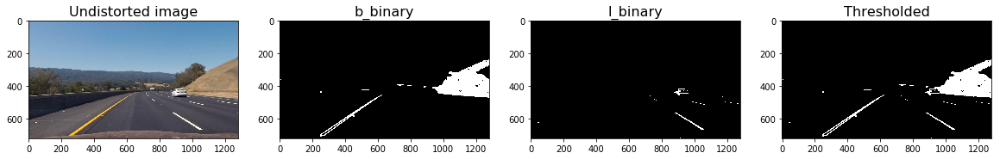

In [316]:
#test color transform
for fname in images:
    imgs = cv2.imread(fname)
    imgs = cv2.cvtColor(imgs, cv2.COLOR_BGR2RGB)
    undist = undistort(imgs, mtx, dist)
    _ = threshold(undist,out_image=fname.replace('test_images','output_images'), show=True)

## Apply a perspective transform to rectify binary image ("birds-eye view").

In [317]:
def perspective(thresh, persp_image='', show=False):
    # Define calibration box in source (original) and destination (desired or warped) coordinates
    img_size = (thresh.shape[1], thresh.shape[0])

    src = np.float32(
        [[(img_size[0] / 2) - 40, img_size[1] / 2 + 100], 
        [((img_size[0] / 6) - 50), img_size[1]],
        [(img_size[0] * 5 / 6) + 80, img_size[1]], 
        [(img_size[0] / 2 + 80), img_size[1] / 2 + 100]])
    
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    
    # Compute the perspective transfor, M
    M = cv2.getPerspectiveTransform(src, dst)

    # Compute the inverse perspective transfor also by swapping the input parameters
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Create warped image - uses linear interpolation
    warped = cv2.warpPerspective(thresh, M, img_size, flags=cv2.INTER_LINEAR)

    if persp_image != '':
        if len(thresh.shape) == 2:
            plt.imsave(persp_image, warped, cmap='gray')
        else:
            plt.imsave(persp_image, warped)
    
    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        ax1.plot(Polygon(src).get_xy()[:, 0], Polygon(src).get_xy()[:, 1], color='red')
        if len(thresh.shape) == 2:
            ax1.set_title('Thresholded image', fontsize=16)
            ax1.imshow(thresh, cmap='gray')
        else:
            ax1.set_title('Undistorted image', fontsize=16)
            ax1.imshow(thresh)
        ax2.set_title('Perspective Transformed Image', fontsize=16)
        ax2.plot(Polygon(dst).get_xy()[:, 0], Polygon(dst).get_xy()[:, 1], color='red')
        ax2.imshow(warped, cmap='gray')
   
    return warped, M, Minv

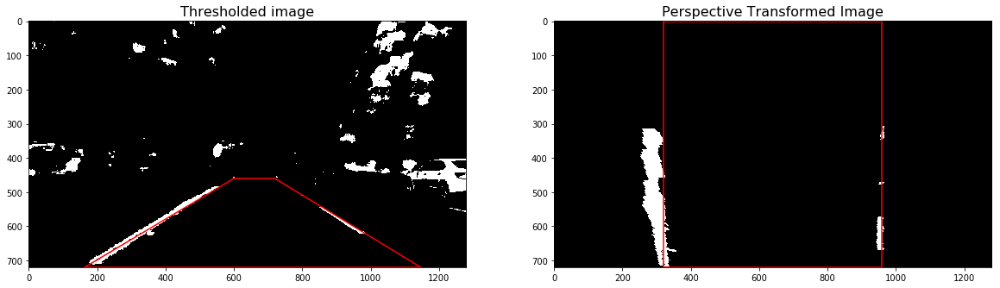

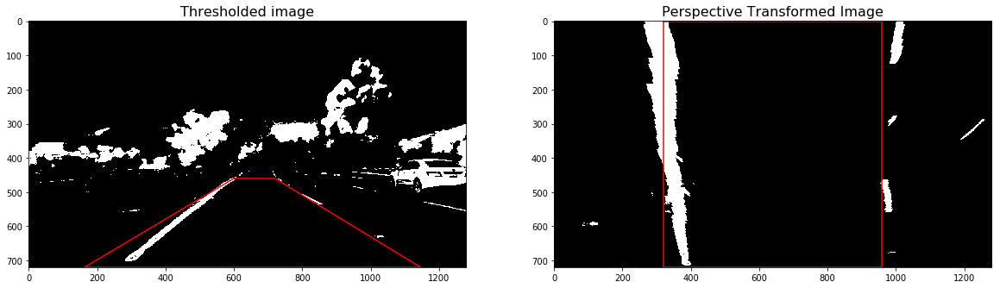

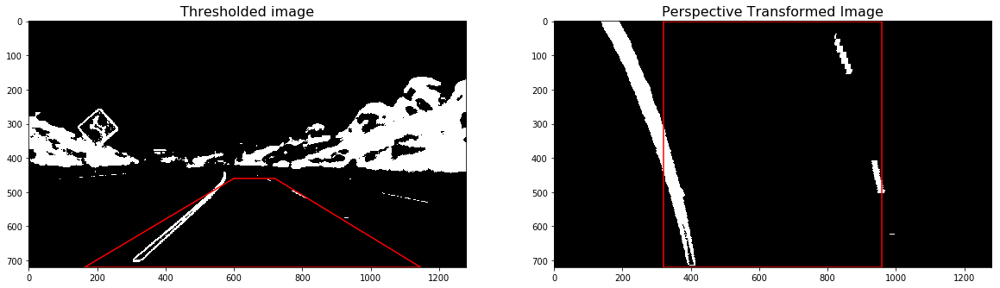

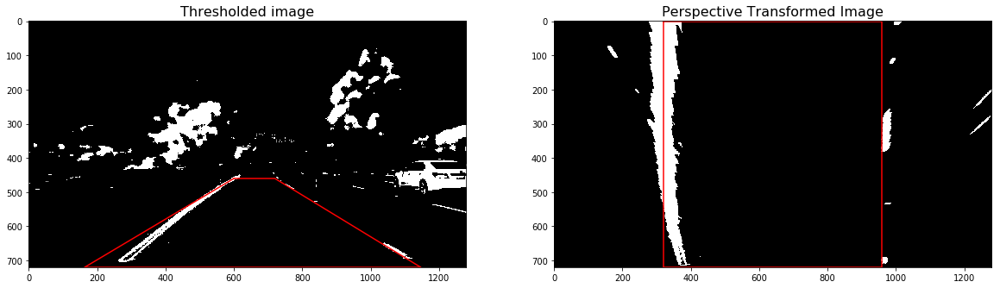

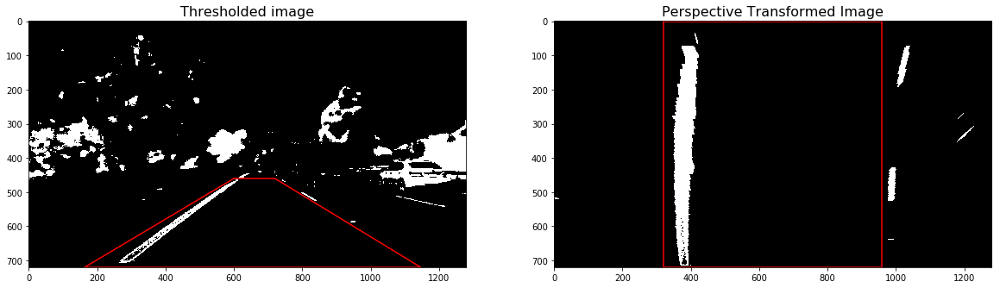

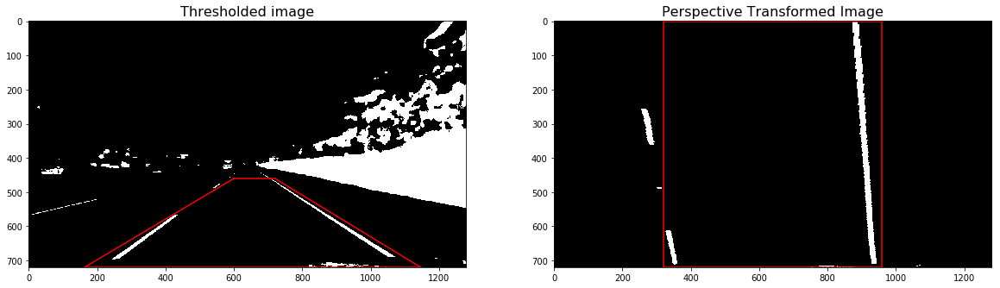

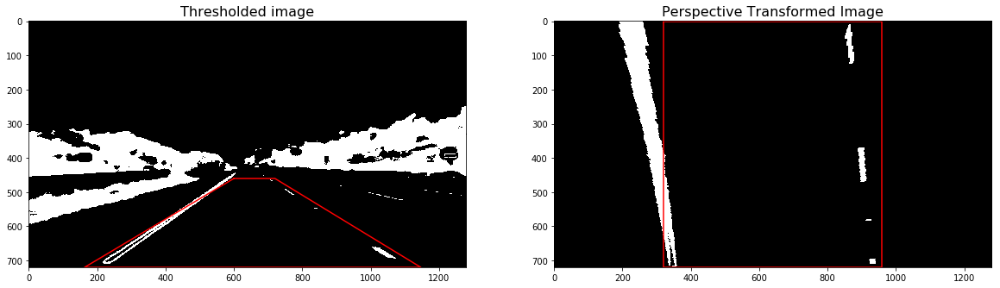

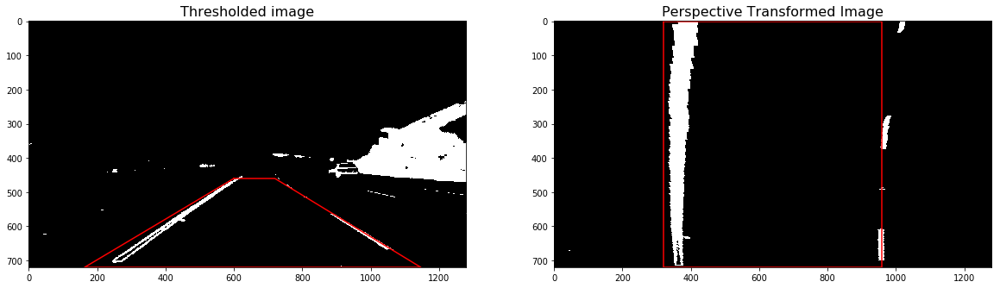

In [318]:
#test perspective transform
for fname in images:
    imgs = cv2.imread(fname)
    imgs = cv2.cvtColor(imgs, cv2.COLOR_BGR2RGB)
    undist = undistort(imgs, mtx, dist)
    thresh = threshold(undist)
    _ = perspective(thresh, fname.replace('test_images','output_images').replace('.jpg','_persp.jpg'), show=True)

## Detect lane pixels and fit to find the lane boundary.

In [319]:
def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

g_l_center = -1
g_r_center = -1
def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    global g_l_center
    global g_r_center
    l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(image.shape[1]/2)

    if g_l_center == -1 or (g_l_center > 0 and abs(g_l_center - l_center) < 100):
        g_l_center = l_center
    else:
        l_center = g_l_center
    
    if g_r_center == -1 or (g_r_center > 0 and abs(g_r_center - r_center) < 100):
        g_r_center = r_center
    else:
        r_center = g_r_center

        # Add what we found for the first layer
    window_centroids.append((image.shape[0]-(window_height/2), l_center,r_center))
    
    l_drift = 0
    r_drift = 0
    l_center_old = l_center
    r_center_old = r_center
    l_count=1
    r_count=1
    l_margin = margin
    r_margin = margin
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-l_margin,0))
        l_max_index = int(min(l_center+offset+l_margin,image.shape[1]))
        if max(conv_signal[l_min_index:l_max_index]) > 40000:
            l_center_old = l_center
            l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
            drift = l_center - l_center_old
            l_drift = (l_drift*(l_count-1) + drift)/l_count
            l_count+=1
        else:
            l_center += l_drift
            l_margin += abs(l_drift)
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-r_margin,0))
        r_max_index = int(min(r_center+offset+r_margin,image.shape[1]))
        if max(conv_signal[r_min_index:r_max_index]) > 40000:
            r_center_old = r_center
            r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
            drift = r_center - r_center_old
            r_drift = (r_drift*(r_count-1) + drift)/r_count
            r_count+=1
        else:
            r_center += r_drift
            r_margin += abs(r_drift)
        # Add what we found for that layer
        window_centroids.append((image.shape[0]-((level+0.5)*window_height), l_center,r_center))

    return window_centroids

In [320]:
def draw_centroids(warped, window_image='', show=False):
    warped*=255
    window_centroids = find_window_centroids(warped, window_width, window_height, margin)

    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][2],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green        
        warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        print("no window centroids found")
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    
    if window_image != '':
        plt.imsave(window_image, output)
        
    if show:
        # Display the final results
        plt.imshow(output)
        plt.title('window fitting results')
        plt.show()
    return window_centroids

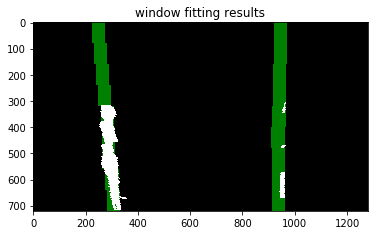

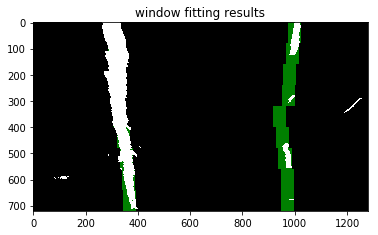

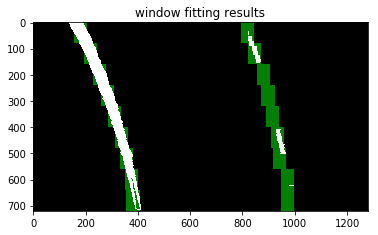

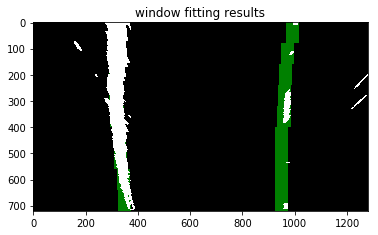

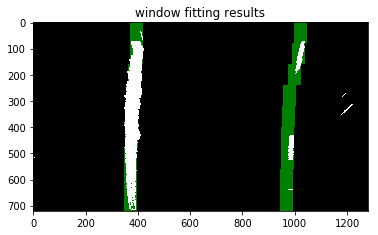

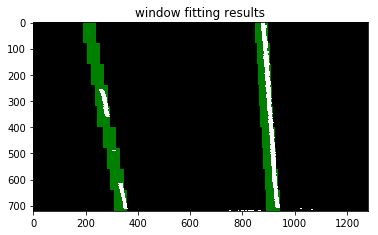

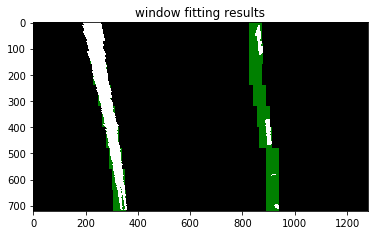

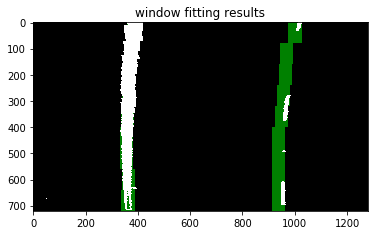

In [321]:
#test sliding window
for fname in images:
    imgs = cv2.imread(fname)
    imgs = cv2.cvtColor(imgs, cv2.COLOR_BGR2RGB)
    undist = undistort(imgs, mtx, dist)
    thresh = threshold(undist)
    warped,_,_ = perspective(thresh)
    _ = draw_centroids(warped,window_image=fname.replace('test_images','output_images').replace('.jpg','_window.jpg'), show=True)

## Determine the curvature of the lane and vehicle position with respect to center.

In [322]:
def measure_curvature_real(img_shape, left_fitx, right_fitx, ploty, ym_per_pix, xm_per_pix):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''        
    
    # Fit a second order polynomial to pixel positions in each fake lane line
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    left_fit = np.polyfit(ploty, left_fitx, 2)
    right_fit = np.polyfit(ploty, right_fitx, 2)
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    ## Image mid horizontal position 
    mid_imgx = img_shape[1]//2

    ## Car position with respect to the lane
    car_pos = (left_fitx[-1] + right_fitx[-1])/2
    
    center_offset = (mid_imgx - car_pos) * xm_per_pix
    
    return left_curverad, right_curverad, center_offset

In [323]:
#test curvature calculation
for fname in images:
    imgs = cv2.imread(fname)
    imgs = cv2.cvtColor(imgs, cv2.COLOR_BGR2RGB)
    undist = undistort(imgs, mtx, dist)
    thresh = threshold(undist)
    warped,_,_ = perspective(thresh)
    window_centroids = draw_centroids(warped)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Curve fitting
    #print(window_centroids)
    window_centroids=np.array(window_centroids)
    ploty=window_centroids[:,0]
    leftx=window_centroids[:,1]
    rightx=window_centroids[:,2]
    left_fit = np.polyfit(ploty, leftx, 2)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fit = np.polyfit(ploty, rightx, 2)
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    left_curverad, right_curverad, center_offset = measure_curvature_real(warped.shape, left_fitx, right_fitx, ploty, ym_per_pix, xm_per_pix)
    print('Left line curvature:', left_curverad, 'm')
    print('Right line curvature:', right_curverad, 'm')
    print ('Car offset from center:', center_offset, 'm.')    

Left line curvature: 14284.1432313 m
Right line curvature: 4855.86355277 m
Car offset from center: 0.217595238095 m.
Left line curvature: 3708.37149542 m
Right line curvature: 534.785039061 m
Car offset from center: -0.0787571428571 m.
Left line curvature: 562.579537785 m
Right line curvature: 812.258367317 m
Car offset from center: 0.735867532468 m.
Left line curvature: 1962.62550454 m
Right line curvature: 1220.09024464 m
Car offset from center: -0.0475313852814 m.
Left line curvature: 2301.35527277 m
Right line curvature: 843.062564307 m
Car offset from center: -0.378028679654 m.
Left line curvature: 6075.96731258 m
Right line curvature: 7833.2635649 m
Car offset from center: 0.500845454545 m.
Left line curvature: 2135.14005355 m
Right line curvature: 4870.60542129 m
Car offset from center: 0.552717532468 m.
Left line curvature: 1178.70825044 m
Right line curvature: 814.777334502 m
Car offset from center: -0.260137229437 m.


## Warp the detected lane boundaries back onto the original image.

In [324]:
def draw_lane(undist, persp, left_fitx, right_fitx, ploty, Minv, lane_image='', show=False):
    # Create an image to draw the lines on
    persp_zero = np.zeros_like(persp).astype(np.uint8)
    color_persp = np.dstack((persp_zero, persp_zero, persp_zero))

    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_persp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    inv_persp = cv2.warpPerspective(color_persp, Minv, (undist.shape[1], undist.shape[0])) 
    #print(inv_persp)
    #print(undist)
    # Combine the result with the original image
    lane = cv2.addWeighted(undist, 1, inv_persp, 0.3, 0)

    if lane_image != '':
        plt.imsave(lane_image, lane)
    
    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        ax1.set_title('Undistorted image', fontsize=16)
        ax1.imshow(undist)
        ax2.set_title('Detected Lane', fontsize=16)
        ax2.imshow(lane)
    
    return lane

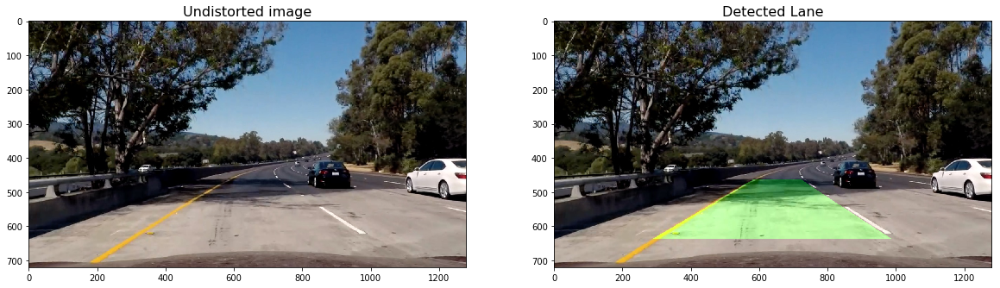

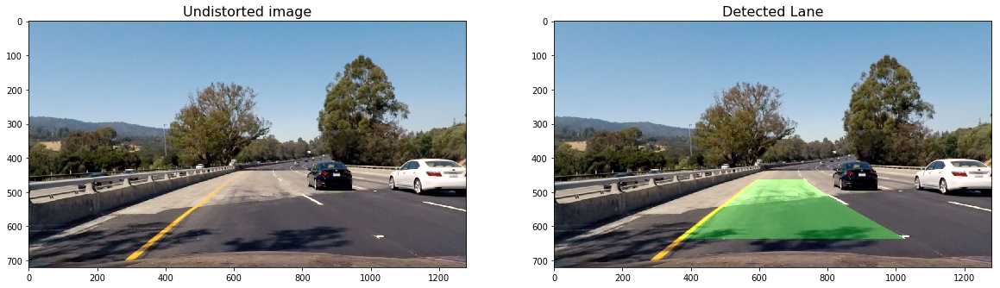

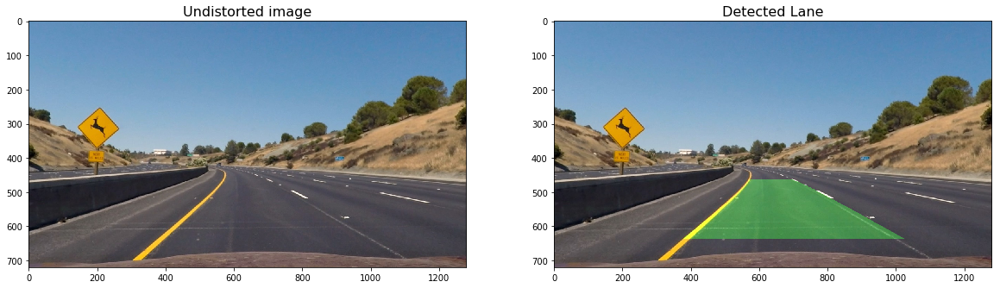

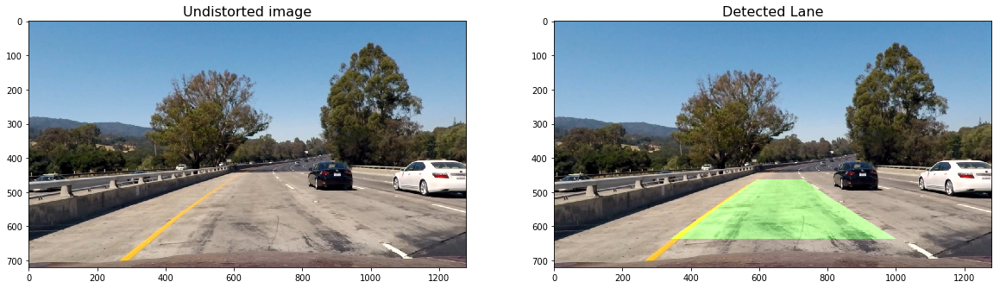

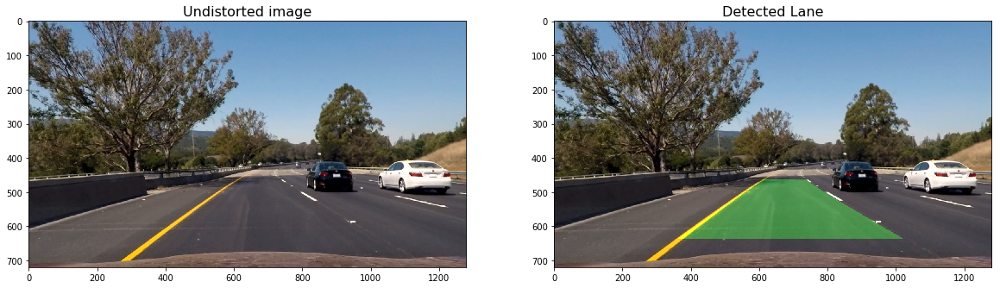

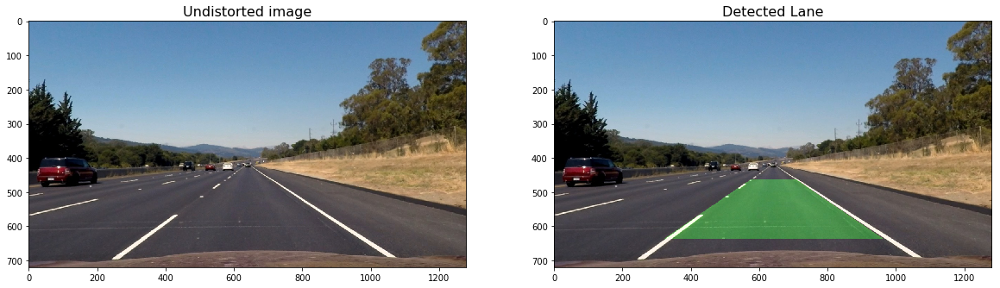

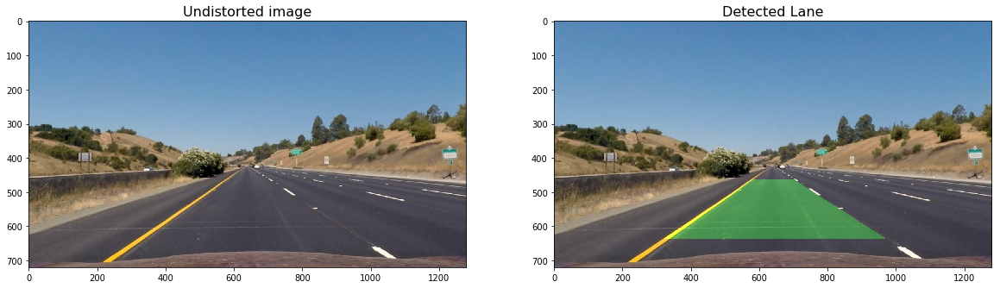

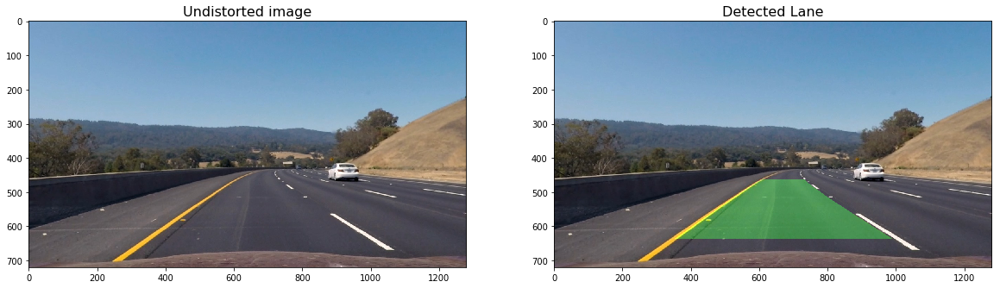

In [325]:
#test lane image
for fname in images:
    imgs = cv2.imread(fname)
    imgs = cv2.cvtColor(imgs, cv2.COLOR_BGR2RGB)
    undist = undistort(imgs, mtx, dist)
    thresh = threshold(undist)
    warped,M,Minv = perspective(thresh)
    window_centroids = draw_centroids(warped)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Curve fitting
    #print(window_centroids)
    window_centroids=np.array(window_centroids)
    ploty=window_centroids[:,0]
    leftx=window_centroids[:,1]
    rightx=window_centroids[:,2]
    left_fit = np.polyfit(ploty, leftx, 2)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fit = np.polyfit(ploty, rightx, 2)
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    lane = draw_lane(undist, warped, left_fitx, right_fitx, ploty, Minv,lane_image=fname.replace('test_images','output_images').replace('.jpg','_lane.jpg') , show=True)

## Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [326]:
def caption(lane, left_fitx, right_fitx, ploty, ym_per_pix, xm_per_pix, capt_image='', show=False):    
    
    left_curverad, right_curverad, center_offset = measure_curvature_real(warped.shape, left_fitx, right_fitx, ploty, ym_per_pix, xm_per_pix)
    
    # Display lane curvature
    capt = lane.copy()
    cv2.putText(capt, 'Left lane line curvature: {:.2f} m'.format(left_curverad), 
                (60, 60), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 5)
    cv2.putText(capt, 'Right lane line curvature: {:.2f} m'.format(right_curverad), 
                (60, 110), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 5)
    
    # Display car offset
    cv2.putText(capt, 'Horizontal car offset: {:.2f} m'.format(center_offset), 
                (60, 160), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 5)
    
    if capt_image != '':
        plt.imsave(capt_image, capt)
        
    if show:
        plt.imshow(capt)
    
    return capt

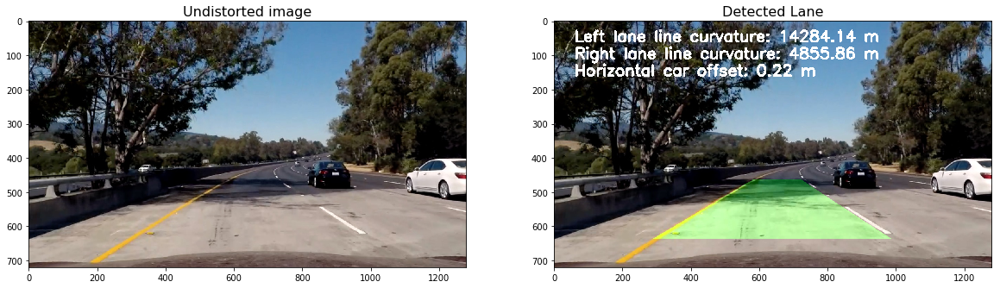

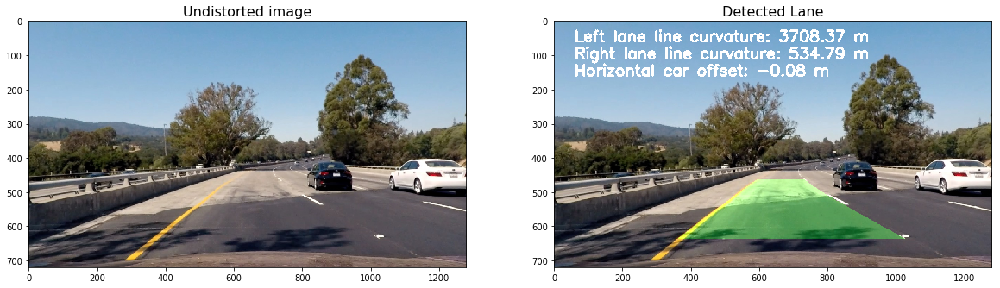

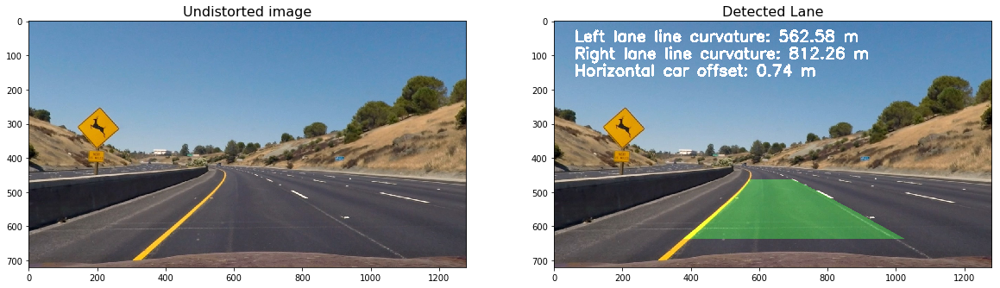

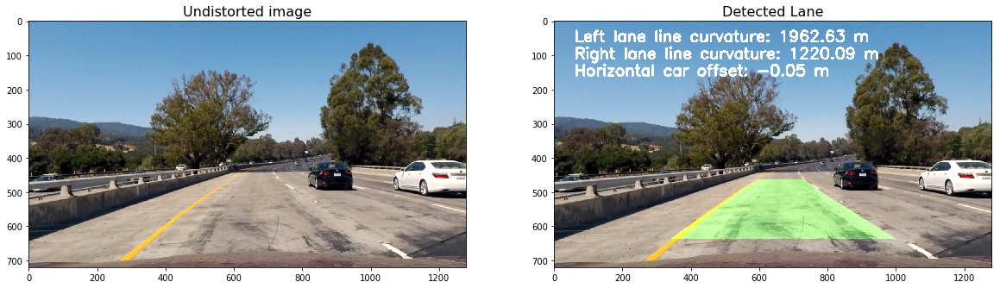

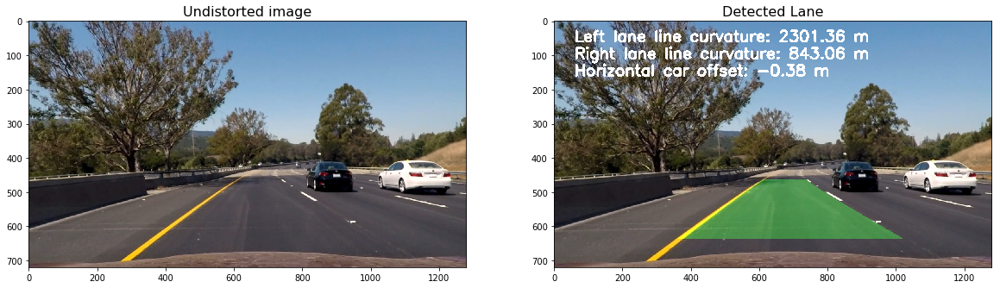

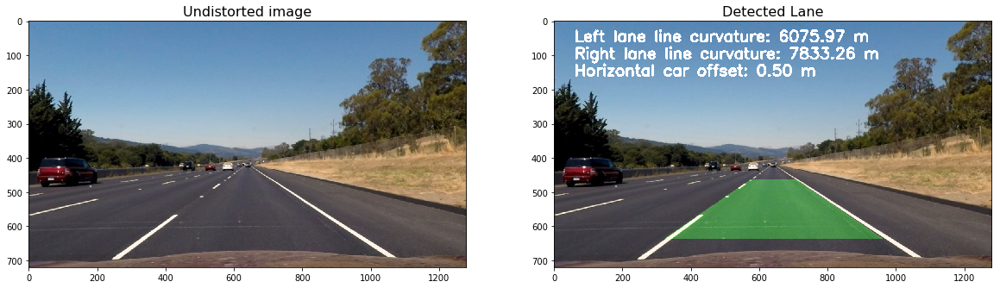

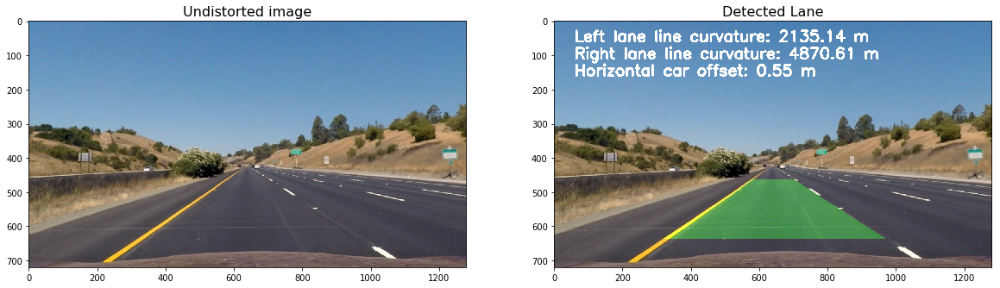

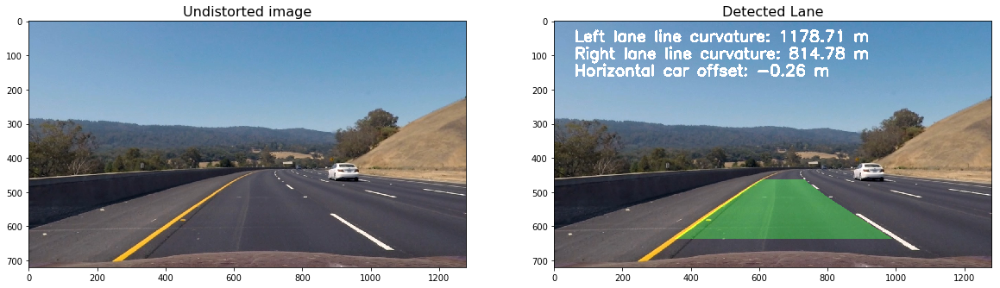

In [327]:
# test caption image
for fname in images:
    imgs = cv2.imread(fname)
    imgs = cv2.cvtColor(imgs, cv2.COLOR_BGR2RGB)
    undist = undistort(imgs, mtx, dist)
    thresh = threshold(undist)
    warped,M,Minv = perspective(thresh)
    window_centroids = draw_centroids(warped)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Curve fitting
    #print(window_centroids)
    window_centroids=np.array(window_centroids)
    ploty=window_centroids[:,0]
    leftx=window_centroids[:,1]
    rightx=window_centroids[:,2]
    left_fit = np.polyfit(ploty, leftx, 2)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fit = np.polyfit(ploty, rightx, 2)
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    #left_curverad, right_curverad, center_offset = measure_curvature_real(warped.shape, left_fitx, right_fitx, ploty, ym_per_pix, xm_per_pix)
    #print('Left line curvature:', left_curverad, 'm')
    #print('Right line curvature:', right_curverad, 'm')
    #print ('Car offset from center:', center_offset, 'm.')
    lane = draw_lane(undist, warped, left_fitx, right_fitx, ploty, Minv, show=True)
    capt = caption(lane, left_fitx, right_fitx, ploty, ym_per_pix, xm_per_pix,capt_image=fname.replace('test_images','output_images').replace('.jpg','_caption.jpg'), show=True)    

## Pipeline

In [328]:
class Pipeline:
    def __init__(self):
        # Arrays to store object points and image points from all the images.
        objpoints = [] # 3d points in real world space
        imgpoints = [] # 2d points in image plane.
    
        CALIBRATION_IMAGES = 'camera_cal/calibration*.jpg'
        
        # number of chessboard corners
        nx = 9
        ny = 6

        self.mtx, self.dist = camera_calibration(CALIBRATION_IMAGES, nx, ny)
        
    def process(self,img):    

        # window settings
        window_width = 50 
        window_height = 80 # Break image into 9 vertical layers since image height is 720
        margin = 100 # How much to slide left and right for searching

        undist = undistort(img, mtx, dist)
        thresh = threshold(undist)
        warped,M,Minv = perspective(thresh)
        window_centroids = draw_centroids(warped)

        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension

        # Curve fitting
        #print(window_centroids)
        window_centroids=np.array(window_centroids)
        ploty=window_centroids[:,0]
        leftx=window_centroids[:,1]
        rightx=window_centroids[:,2]
        left_fit = np.polyfit(ploty, leftx, 2)
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fit = np.polyfit(ploty, rightx, 2)
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        #left_curverad, right_curverad, center_offset = measure_curvature_real(warped.shape, left_fitx, right_fitx, ploty, ym_per_pix, xm_per_pix)
        #print('Left line curvature:', left_curverad, 'm')
        #print('Right line curvature:', right_curverad, 'm')
        #print ('Car offset from center:', center_offset, 'm.')
        lane = draw_lane(undist, warped, left_fitx, right_fitx, ploty, Minv)
        capt = caption(lane, left_fitx, right_fitx, ploty, ym_per_pix, xm_per_pix)    
        return capt

## Test on Project Video

In [329]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [330]:
def find_lane_in_video(input_video, output_video):
    clip1 = VideoFileClip(input_video)
    p1 = Pipeline()
    white_clip = clip1.fl_image(p1.process) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(output_video, audio=False)    

In [331]:
def show_video(VIDEO):
    return HTML("""
        <video width="960" height="540" controls>
        <source src="{0}">
        </video>
    """.format(VIDEO))

## Test on Project Video

In [332]:
PROJECT_VIDEO = 'project_video.mp4'
PROJECT_VIDEO_OUTPUT = 'project_video_output.mp4'
find_lane_in_video(PROJECT_VIDEO, PROJECT_VIDEO_OUTPUT)

Camera successfully calibrated.
[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [05:10<00:00,  4.26it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 2min 57s, sys: 2.8 s, total: 2min 59s
Wall time: 5min 13s


In [333]:
show_video(PROJECT_VIDEO_OUTPUT)

## Test on Challenge video

In [334]:
CHALLENGE_VIDEO = 'challenge_video.mp4'
CHALLENGE_VIDEO_OUTPUT = 'challenge_video_output.mp4'
find_lane_in_video(CHALLENGE_VIDEO, CHALLENGE_VIDEO_OUTPUT)

Camera successfully calibrated.
[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████| 485/485 [01:55<00:00,  3.99it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 1min 7s, sys: 1.33 s, total: 1min 8s
Wall time: 1min 58s


In [335]:
show_video(CHALLENGE_VIDEO_OUTPUT)

## Test on Harder Challenge video

In [336]:
HARDER_CHALLENGE_VIDEO = 'harder_challenge_video.mp4'
HARDER_CHALLENGE_VIDEO_OUTPUT = 'harder_challenge_video_output.mp4'
find_lane_in_video(CHALLENGE_VIDEO, CHALLENGE_VIDEO_OUTPUT)

Camera successfully calibrated.
[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████| 485/485 [01:56<00:00,  4.11it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 1min 7s, sys: 1.08 s, total: 1min 8s
Wall time: 1min 59s


In [337]:
show_video(HARDER_CHALLENGE_VIDEO_OUTPUT)